In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.text import Text
import matplotlib.path as path
import matplotlib.patches as patches
from matplotlib import animation, rc
from IPython.display import HTML, Image
from balls_in_box import ParticleBox

In [23]:
# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')

# Relaxation of Speeds to Maxwell-Boltzmann Distribution

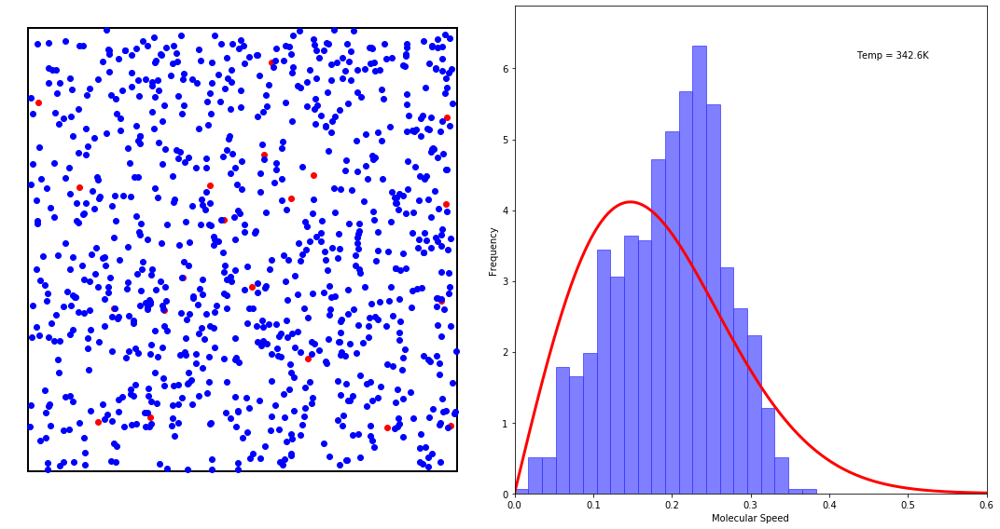

In [26]:
kb = 3.17E-6  # Hartree atomic units
R = 3.17E-6  # ideal gas constant in Eh/K/molecule
m=0.05
cmax = 0.6
c_au = np.linspace(0, cmax, 500)
#c_conv = 2.188E6  # multiply by au to get m/s
#c = c_au * c_conv

r = 0.02
s = 6.0
bounds=[-s/2, s/2, -s/2, s/2]
np.random.seed(0)
init_state = -0.5 + np.random.random((900, 4))
init_state[:, :2] *= (s - 2*r)
init_state[:, 2:] *= 0.5  # tone down temp
box = ParticleBox(init_state, size=r, M=m, bounds=bounds)
dt = 1. / 30  # 30fps

# set up figure and animation
fig = plt.figure(figsize=(15, 8))

# axis for displaying the particles
ax1 = fig.add_subplot(121, autoscale_on=False, xlim=(-1.1*s/2, 1.1*s/2), ylim=(-1.1*s/2, 1.1*s/2))
ax1.axis('off')

ms = int(fig.dpi * 2 * r * fig.get_figwidth() / np.diff(ax1.get_xbound())[0])

# axis for displaying the histogram of speeds
ax2 = fig.add_subplot(122, autoscale_on=False)
ax2.set_xlim([0,cmax])
ax2.set_xlabel('Molecular Speed')
ax2.set_ylabel('Frequency')
cs = np.linalg.norm(box.state[:, 2:], axis=1)  # particle speeds

# histogram our data with numpy
nbins = 30
bins = np.arange(0, 1.5 * max(cs), 1.5 * max(cs) / nbins)
n, bins = np.histogram(cs, bins, density=True)

# get the corners of the rectangles for the histogram
left = np.array(bins[:-1])
right = np.array(bins[1:])
bottom = np.zeros(len(left))
top = bottom + n
nrects = len(left)
nverts = nrects * (1 + 3 + 1)
verts = np.zeros((nverts, 2))
codes = np.ones(nverts, int) * path.Path.LINETO
codes[0::5] = path.Path.MOVETO
codes[4::5] = path.Path.CLOSEPOLY
verts[0::5, 0] = left
verts[0::5, 1] = bottom
verts[1::5, 0] = left
verts[1::5, 1] = top
verts[2::5, 0] = right
verts[2::5, 1] = top
verts[3::5, 0] = right
verts[3::5, 1] = bottom

# Draw the Patch for the Histogram
barpath = path.Path(verts, codes)
patch = patches.PathPatch(barpath, facecolor='blue', edgecolor='blue', alpha=0.5)
ax2.add_patch(patch)
ax2.set_ylim(0, 1.1 * max(n))

# add text for temp
urms = np.sqrt(np.mean(cs**2))
T_m = np.mean(0.5 * m * cs**2) / R
text = ax2.text(0.8, 0.9, f'Temp = {T_m:.1f}K', horizontalalignment='center',
                verticalalignment='center', transform=ax2.transAxes)

pdf = m * c_au / (kb * T_m) * np.exp(-m * c_au ** 2 / (2 * kb * T_m))
mb, = ax2.plot(c_au, pdf, f'r-', linewidth=3, label=f'T = {T_m}K')

# particles holds the locations of the particles
particles_r, = ax1.plot([], [], 'ro', ms=ms)
particles, = ax1.plot([], [], 'bo', ms=ms)

# rect is the box edge
rect = plt.Rectangle(box.bounds[::2], box.bounds[1] - box.bounds[0],  box.bounds[3] - box.bounds[2],
                     ec='k', lw=2, fc='none')
ax1.add_patch(rect)


def animate(i):
    global bins
    """perform animation step"""
    global box, dt, ax1, fig, particles
    box.step(dt)

    # update pieces of the animation
    particles_r.set_data(box.state[:20, 0], box.state[:20, 1])
    particles.set_data(box.state[20:, 0], box.state[20:, 1])
    
    if i % 10 == 0:
        # update velocity histogram
        cs = np.linalg.norm(box.state[:, 2:], axis=1)  # particle speeds
        n, bins = np.histogram(cs, bins, density=True)
        #freq, _, hist = ax2.hist(cs, bins=bins, density=True, ec='b', fc='b', alpha=0.4)
        top = n
        verts[1::5, 1] = top
        verts[2::5, 1] = top

        # get temperature
        urms = np.sqrt(np.mean(cs**2))
        T_m = np.mean(0.5 * m * cs**2) / R
        text.set_text(f'Temp = {T_m:.1f}K')

        ymin, ymax = ax2.get_ylim()
        if np.max(n) >= ymax:
            ax2.set_ylim(ymin, np.max(n) * 1.1)
            ax2.figure.canvas.draw()
    return [particles, rect, mb, patch, text]


ani = animation.FuncAnimation(fig, animate, frames=700,
                              interval=10, blit=True)
plt.tight_layout()

In [27]:
ani

In [25]:
# save the animation as a gif
#rcParams['animation.convert_path'] = r'/usr/bin/convert'
#ani.save('particle_speeds.gif', writer='imagemagick')

In [28]:
ani.save('particle_speeds_12.mp4', extra_args=['-vcodec', 'libx264'])

In [ ]:
Image('particle_box.gif')

# Diffusion of 2 Gases of Different Masses

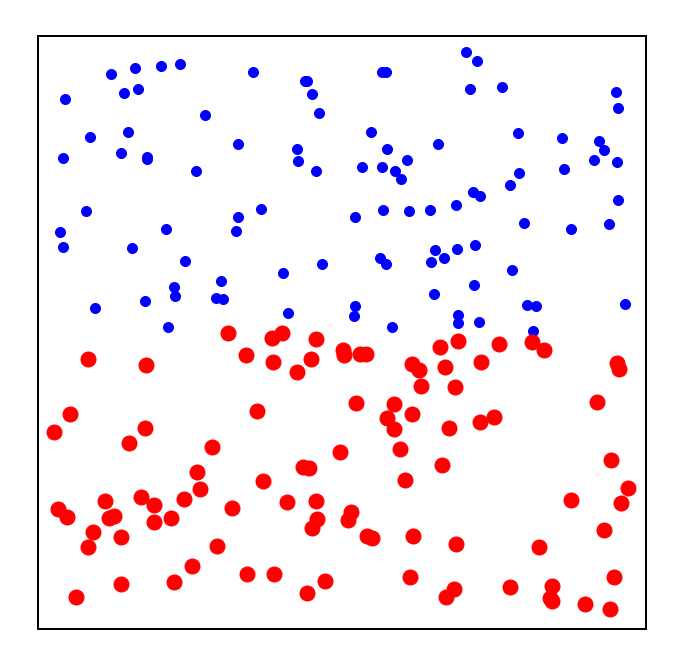

In [29]:
np.random.seed(0)
s = 6.0
bounds=[-s/2, s/2, -s/2, s/2]
n1 = 100
n2 = 100
T = 300
m1 = 0.02
m2 = 0.04
r1 = 0.04
r2 = 0.06

# start 100 blue particles in the top half
init_posb = np.random.random((n1, 2))
init_posb[:, 0] -= 0.5
init_posb[:, 0] *= 0.95 * s
init_posb[:, 1] *= 0.95 * s / 2
# initialize velocities with correct MB distribution
init_vb = np.random.normal(loc=0, scale=np.sqrt(kb * T / m1), size=(n1, 2))
init_stateb = np.concatenate([init_posb, init_vb], axis=1)
m1s = m1 * np.ones(n1)
rs1 = r1 * np.ones(n1)

# start 100 red particles in the bottom half
init_posr = np.random.random((n2, 2))
init_posr[:, 1] -= 1
init_posr[:, 1] *= 0.95 * s / 2
init_posr[:, 0] -= 0.5
init_posr[:, 0] *= 0.95 * s
init_vr = np.random.normal(loc=0, scale=np.sqrt(kb * T / m2), size=(n2, 2))
init_stater = np.concatenate([init_posr, init_vr], axis=1)
m2s = m2 * np.ones(n2)
rs2 = r2 * np.ones(n2)

r = np.concatenate([rs1,rs2])
m = np.concatenate([m1s,m2s])
init_state = np.concatenate([init_stateb, init_stater])

cmax = 1.2
c_au = np.linspace(0, cmax, 500)

box = ParticleBox(init_state, size=r, M=m, bounds=bounds)
dt = 1. / 30  # 30fps

# set up figure and animation
fig = plt.figure(figsize=(12, 12))

# axis for displaying the particles
ax1 = fig.add_subplot(111, autoscale_on=False, xlim=(-1.1*s/2, 1.1*s/2), ylim=(-1.1*s/2, 1.1*s/2))
ax1.axis('off')

ms1 = int(fig.dpi * 2 * r1 * fig.get_figwidth() / np.diff(ax1.get_xbound())[0])

ms2 = int(fig.dpi * 2 * r2 * fig.get_figwidth() / np.diff(ax1.get_xbound())[0])

# particles holds the locations of the particles
parts1, = ax1.plot(box.state[:n1, 0], box.state[:n1, 1], 'bo', ms=ms1)
parts2, = ax1.plot(box.state[n1:, 0], box.state[n1:, 1], 'ro', ms=ms2)

# rect is the box edge
rect = plt.Rectangle(box.bounds[::2], box.bounds[1] - box.bounds[0],  box.bounds[3] - box.bounds[2],
                     ec='k', lw=2, fc='none')
ax1.add_patch(rect)


def animate(i):
    """perform animation step"""
    box.step(dt)

    # update pieces of the animation
    parts1.set_data(box.state[:n1, 0], box.state[:n1, 1])
    parts2.set_data(box.state[n1:, 0], box.state[n1:, 1])
    
    return [particles, rect, mb, patch, text]


ani2 = animation.FuncAnimation(fig, animate, frames=1000, interval=10, blit=True)

In [30]:
ani2

In [31]:
ani2.save('diffusion_big.mp4', extra_args=['-vcodec', 'libx264'])

In [32]:
ani.save('diffusion.gif', writer='imagemagick')